In [1]:
# import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from skimage.filters import threshold_otsu
from skimage.io import imread, imsave
from skimage.color import rgb2gray
from skimage.measure import label, regionprops
import json
import os
import uuid
from PIL import Image
import random
import math
import imageio
import imgaug as ia
from imgaug import augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

In [2]:
rects = []
bbs = None
img = None

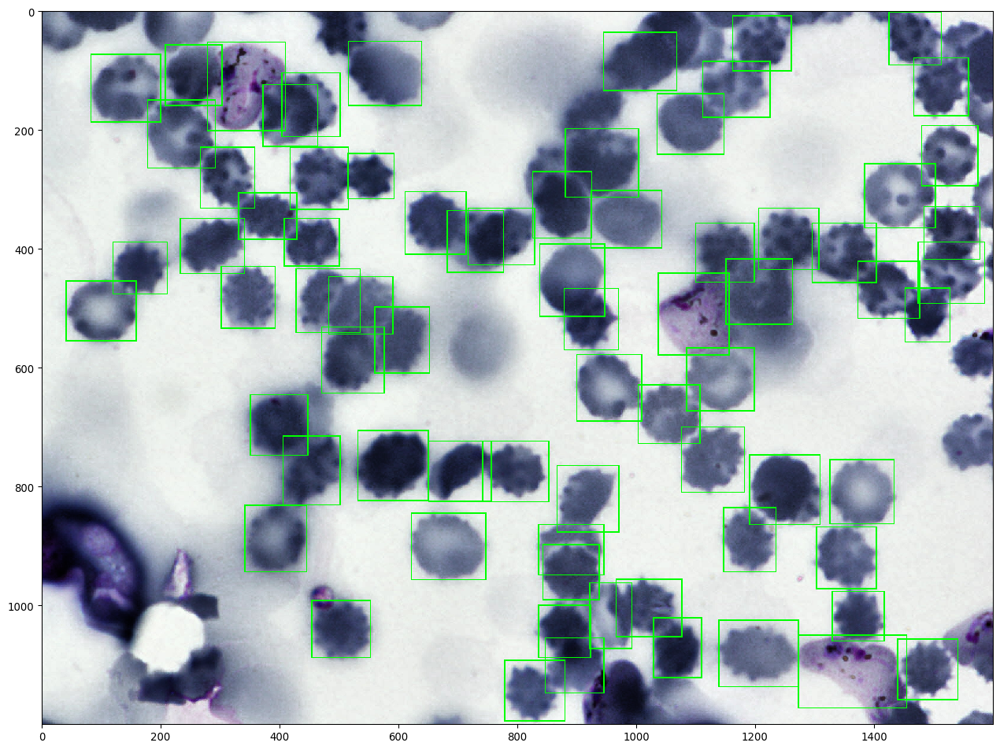

In [3]:
rects = []
labels = os.path.join('training_data','training.json')
with open(labels,'r') as json_file:
    datas = json.load(json_file)
    for data in datas:
        img_name = data['image']['pathname']
        names = img_name.split('/')
        result = os.path.join('training_data',names[1],names[2])
        img = imread(result)
        objects = data['objects']
        for obj in objects:
            minr = obj['bounding_box']['minimum']['r']
            minc = obj['bounding_box']['minimum']['c']
            maxr = obj['bounding_box']['maximum']['r']
            maxc = obj['bounding_box']['maximum']['c']
            category = obj['category']
            if (category == "red blood cell" or category == "leukocyte"):
                box1 = ' '+str(minc)+','+str(minr)+','+str(maxc)+','+str(maxr)+',0'
                rects.append(BoundingBox(x1=minc,y1=minr,x2=maxc,y2=maxr,label=0))
#                 result += box1
            elif category == "ring" or category == "trophozoite" or category == "schizont" or category == "gametocyte":
                box1 = ' '+str(minc)+','+str(minr)+','+str(maxc)+','+str(maxr)+',1'
                rects.append(BoundingBox(x1=minc,y1=minr,x2=maxc,y2=maxr,label=1))
#                 result += box1
        bbs = BoundingBoxesOnImage(rects,shape=img.shape)
        ia.imshow(bbs.draw_on_image(img, size=2))
        break

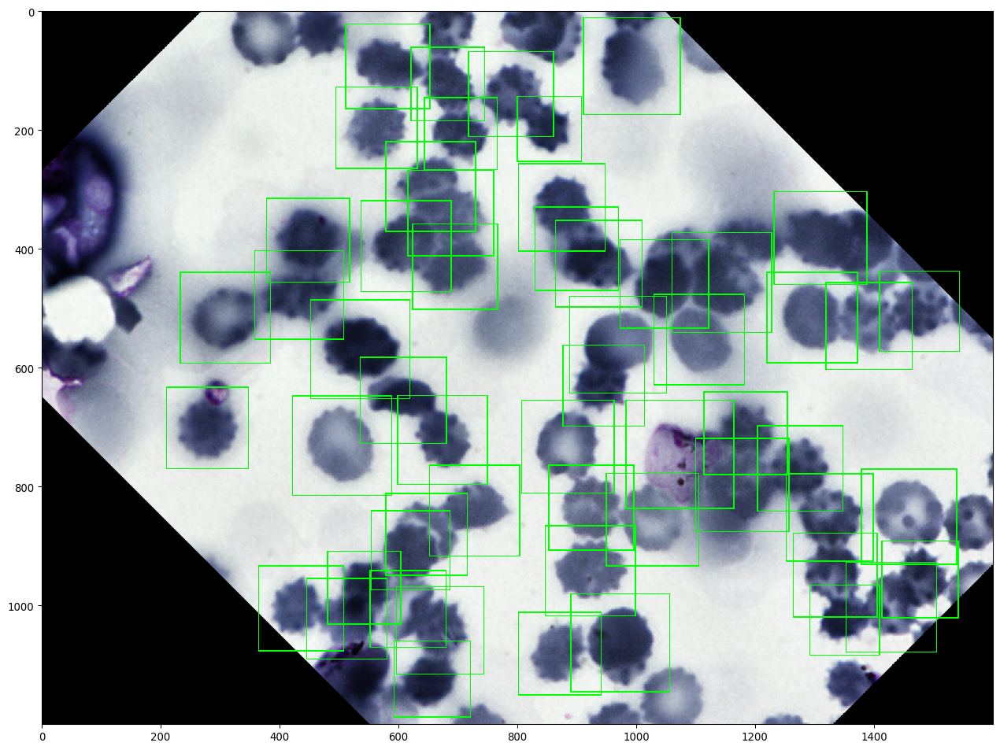

In [4]:
image_aug, bbs_aug = iaa.Affine(rotate=45)(image=img, bounding_boxes=bbs)

ia.imshow(bbs_aug.remove_out_of_image(fully=False,partly=True).draw_on_image(image_aug, size=2))

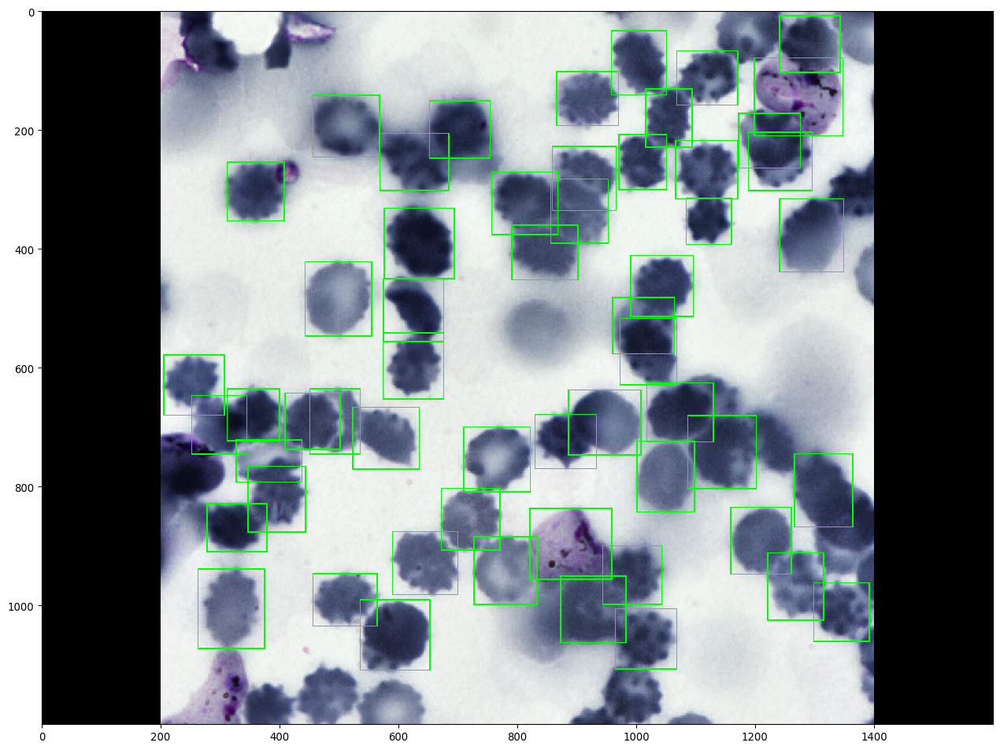

In [6]:
image_aug, bbs_aug = iaa.Affine(rotate=90)(image=img, bounding_boxes=bbs)

ia.imshow(bbs_aug.remove_out_of_image(fully=False,partly=True).draw_on_image(image_aug, size=2))

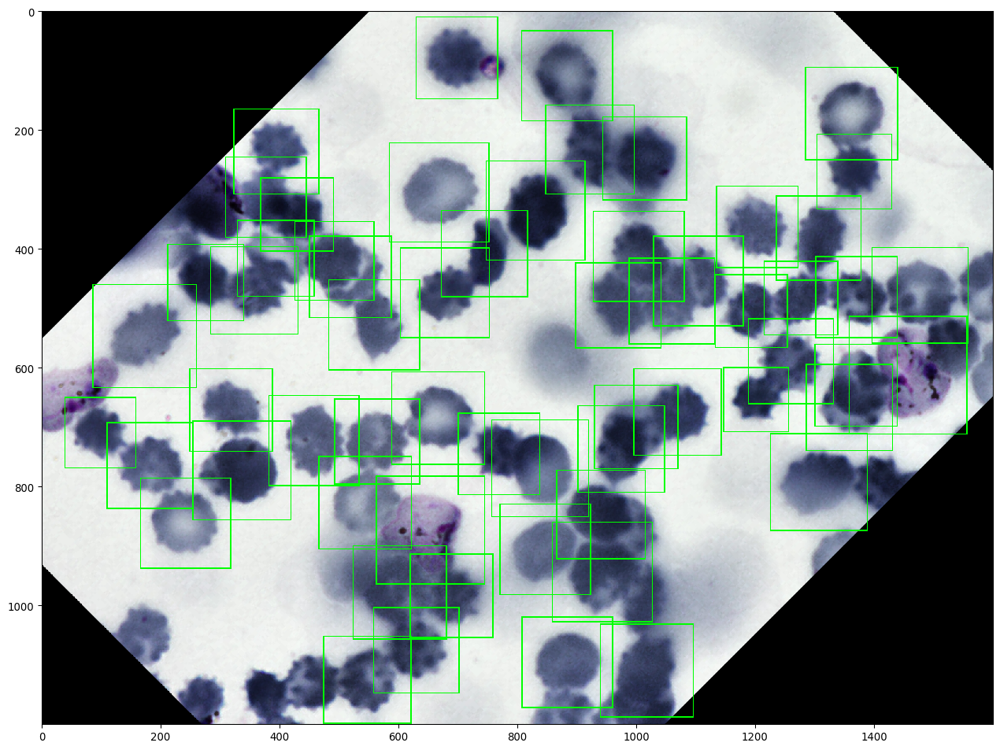

In [7]:
image_aug, bbs_aug = iaa.Affine(rotate=135)(image=img, bounding_boxes=bbs)

ia.imshow(bbs_aug.remove_out_of_image(fully=False,partly=True).draw_on_image(image_aug, size=2))

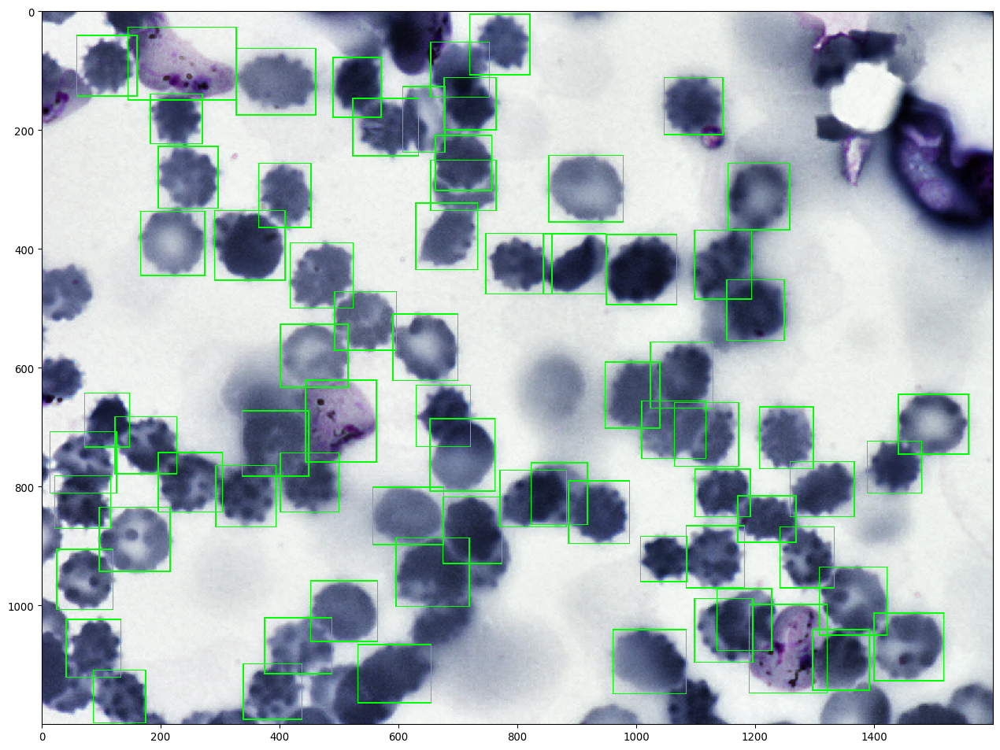

In [8]:
image_aug, bbs_aug = iaa.Affine(rotate=180)(image=img, bounding_boxes=bbs)

ia.imshow(bbs_aug.remove_out_of_image(fully=False,partly=True).draw_on_image(image_aug, size=2))

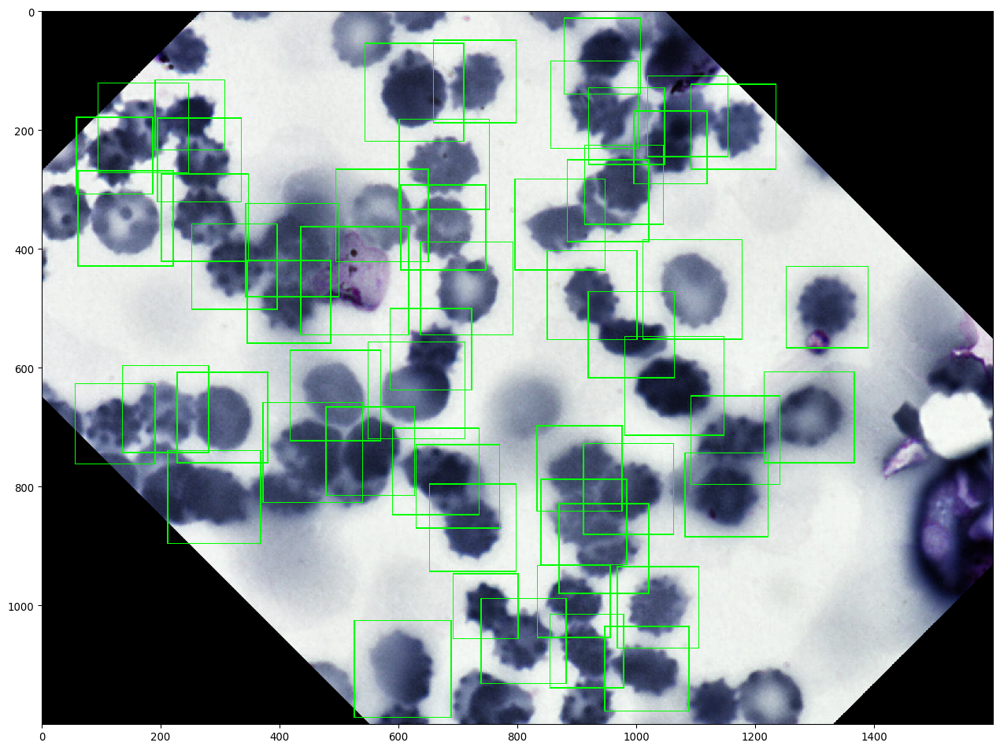

599


In [16]:
image_aug, bbs_aug = iaa.Affine(rotate=225)(image=img, bounding_boxes=bbs)

ia.imshow(bbs_aug.remove_out_of_image(fully=False,partly=True).draw_on_image(image_aug, size=2))

bb = bbs_aug.bounding_boxes[0]
print("x1: %d,x2: %d, class: %s" % (bb.x1,bb.x2,bb.label))